In [1]:
import time
import numpy as np
from scipy.spatial import distance

#topological data analysis
from ripser import ripser
from persim import plot_diagrams

#plotting and visualization
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from matplotlib.patches import Circle

import matplotlib.pyplot as plt
%matplotlib inline

import math
import cmath
from definitions import pentagon

import random
# import numpy as np

#manifold learning and dim red
from sklearn.manifold import Isomap
from sklearn.decomposition import PCA
from sklearn.manifold import LocallyLinearEmbedding as LLE

#topological data analysis
from dreimac import CircularCoords, ToroidalCoords, GeometryExamples, PlotUtils, CircleMapUtils, ComplexProjectiveCoords, ProjectiveMapUtils, GeometryUtils


#plotting and visualization
from jupyter_dash import JupyterDash
from dash import Dash, dcc, html, Input, Output, no_update
import plotly.graph_objects as go
import pandas as pd
import base64

from matplotlib import cm
# import matplotlib.pyplot as plt
# %matplotlib inline

In [2]:
# upload the excel files using pandas

penta2 = np.loadtxt('data/disjoint_tori clean.txt', delimiter=',')

print(penta2.shape)

# print(2%%2)

(43103, 10)


[1.         0.         0.90026974 0.00733994 0.98795181 0.05542169
 0.44530175 0.89538056 0.         0.        ]
[1.0, 0.9002697372131823, 0.9879518072289157, 0.4453017486082558, 0.0]
[0.0, 0.007339937634086347, 0.05542168674698794, 0.895380563049271, 0.0]


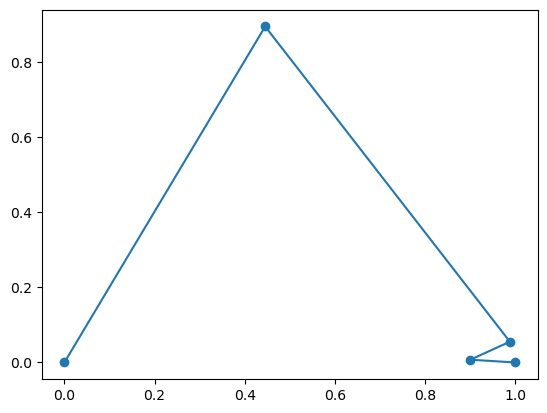

In [3]:
sample1 = penta2[20000]
x_val = []
y_val = []

for i in range(10):
    if i%2 == 0:
        x_val.append(sample1[i])
    else: 
        y_val.append(sample1[i])

print(sample1)
print(x_val)
print(y_val)

plt.plot(x_val, y_val)
plt.scatter(x_val, y_val)

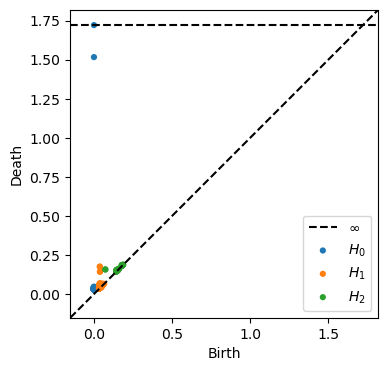

In [4]:
#Using Ripser, we will find the persistence diagrams
#Here I am referecing code from Demo 6 in Day 5 DREimac

n_land = 900
res = ripser(penta2, n_perm = n_land, maxdim=2, coeff =13, thresh = 1.8)
dgms = res['dgms']
fig = plt.figure(figsize = (4,4))
plot_diagrams(dgms)
fig.savefig('disjoint-persistence')

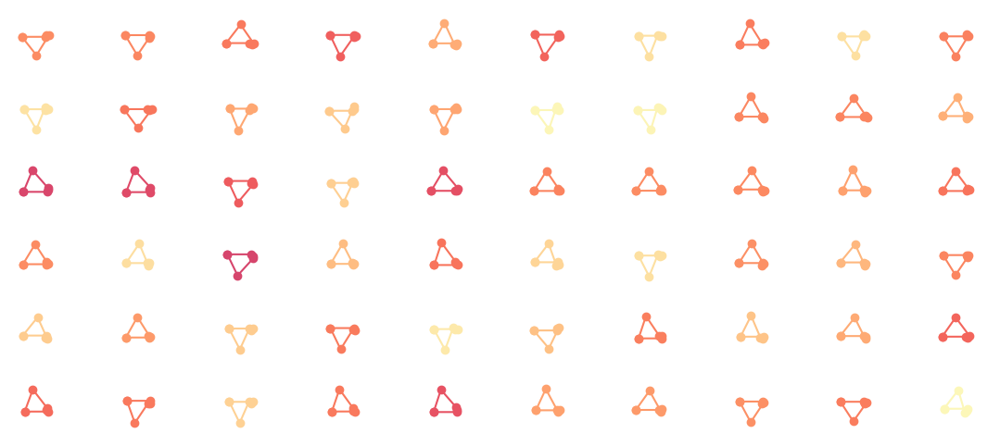

In [5]:
#Energy Computation

angle_data = np.zeros((penta2.shape[0],5)) # internal angles

for i in range(5):
    ii = (2*i -2)%10
    jj = (2*i - 1)%10
    u = penta2[:, [ii, jj]]
    
    ii = (2*i)%10
    jj = (2*i + 1)%10
    v = penta2[:, [ii , jj]]
    
    ii = (2*i + 2)%10
    jj = (2*i + 3)%10
    w = penta2[:, [ii, jj]]
    
    z = np.sum((u - v)*(w-v), axis = 1)
    
    angle_data[:,i]  = np.arccos( np.minimum(z,1) )
    
energy = np.sum((angle_data - (3/5)*np.pi)**2 , axis = 1)

# plot sample pentagons
plt.figure(figsize=(14,6))
for i in range(60):
    ind = random.randint(0, penta2.shape[0])
    x = penta2[ind].reshape(5,2).T
    cent = np.mean(x,axis=1)
    plt.subplot(6,10,i+1)
    plt.plot(x[0,range(-1,5)], x[1,range(-1,5)] , '-o', c= cm.magma(energy[ind]/np.max(energy)))
    plt.axis('square')
    plt.axis('off')
    plt.xlim(cent[0]-1.3,cent[0]+1.3);
    plt.ylim(cent[1]-1.3,cent[1]+1.3);

In [6]:
pers1 = dgms[1][:,1] - dgms[1][:,0]
pers2 = dgms[2][:,1] - dgms[2][:,0]

pers1_sorted = np.sort(pers1)[::-1]
pers2_sorted = np.sort(pers2[pers2 < np.Inf])[::-1]

print('Persistence of top 10 1-d features:\n', np.around(pers1_sorted[0:10],decimals=2), '\n')
print('Persistence of top 10 2-d features:\n', np.around(pers2_sorted[0:10],decimals=2))

n_lands = 1000

cc = CircularCoords(penta2 , n_landmarks= n_lands)

coho_classes = [0, 1, 2, 3]

circular_coords = []

for i in coho_classes:
    circular_coords.append(cc.get_coordinates(perc = 0.6, cocycle_idx=i, standard_range= False))


Persistence of top 10 1-d features:
 [0.14 0.14 0.11 0.1  0.03 0.03 0.03 0.03 0.02 0.02] 

Persistence of top 10 2-d features:
 [0.09 0.08 0.01 0.01 0.01 0.01 0.01 0.01 0.   0.  ]


In [7]:
#Applying Circular coords and doing TDR

thetas= CircleMapUtils.linear_combination(np.array(circular_coords), [[1,0,0,0,0], [0,1,0,0,0],[0,0,1,1,0], [0,1,0,1,0], [0,0,0,0,1]])
# [[1,0,0,0,0], [0,1,0,0,0],[0,0,1,0,0], [-1,0,0,1,0], [0,0,0,0,1]]) #this combo worked for 2 and 4, 2 and 5
# [[1,1,0,0,0], [0,1,0,0,0],[0,0,1,1,0], [0,0,0,1,0], [0,0,0,0,1]] works for 1, 2, 3
# [[1,0,0,0,0], [0,1,0,0,0],[0,0,1,1,0], [0,1,0,1,0], [0,0,0,0,1]]
#[[1,0,3,0,0], [0,1,0.4 ,2,0],[0,0,-0.5,-0.005,0], [1,0,0,-1,0], [0,0,0,0,1]])

theta1 = CircleMapUtils.center(thetas[0])
theta2 = CircleMapUtils.center(thetas[1])
theta3 = CircleMapUtils.center(thetas[2])
theta4 = CircleMapUtils.center(thetas[3])


AssertionError: 

In [ ]:
# Plot the data using the computed circular coordintaes, and colors given by pentagon energy
fig = go.Figure(data=[go.Scatter3d(
    x=theta2, y=theta3, z=theta4, 
    mode ='markers', 
    marker=dict(size = 3, color =energy, colorscale='plasma')
)])

fig.update_layout(autosize=False, width=900, height=900)

fig.show()

In [ ]:
# Plot the data using the computed circular coordintaes, and colors given by pentagon energy
fig = go.Figure(data=[go.Scatter3d(
    x=theta1, y=theta2, z=theta3, 
    mode ='markers', 
    marker=dict(size = 3, color =energy, colorscale='plasma')
)])

fig.update_layout(autosize=False, width=900, height=900)

fig.show()

In [ ]:
# Plot the data using the computed circular coordintaes, and colors given by pentagon energy
fig = go.Figure(data=[go.Scatter3d(
    x=theta1, y=theta2, z=theta4, 
    mode ='markers', 
    marker=dict(size = 3, color =energy, colorscale='plasma')
)])

fig.update_layout(autosize=False, width=900, height=900)

fig.show()

In [ ]:
# Plot the data using the computed circular coordintaes, and colors given by pentagon energy
fig = go.Figure(data=[go.Scatter3d(
    x=theta1, y=theta3, z=theta4, 
    mode ='markers', 
    marker=dict(size = 3, color =energy, colorscale='plasma')
)])

fig.update_layout(autosize=False, width=900, height=900)

fig.show()

In [ ]:
# # Initialise the subplot function using number of rows and columns
# figure, axis = plt.subplots(2, 2)
  
# # For 1 and 2 Function
# axis[0, 0].scatter(theta1, theta2)
# axis[0, 0].set_title("1 and 2")
  
# # For 1 and 3 Function
# axis[0, 1].scatter(theta1, theta3)
# axis[0, 1].set_title("1 and 3")
  
# # For 1 and 4 Function
# axis[1, 0].scatter(theta1, theta4)
# axis[1, 0].set_title("1 and 4")
  
# # Combine all the operations and display
# figure.tight_layout()
# plt.show()

In [ ]:
# # Initialise the subplot function using number of rows and columns
# figure, axis = plt.subplots(2, 2)
  
# # For 2 and 1 Function
# axis[0, 0].scatter(theta2, theta1)
# axis[0, 0].set_title("2 and 1")
  
# # For 2 and 3 Function
# axis[0, 1].scatter(theta2, theta3)
# axis[0, 1].set_title("2 and 3")
  
# # For 2 and 4 Function
# axis[1, 0].scatter(theta2, theta4)
# axis[1, 0].set_title("2 and 4")
  
# # Combine all the operations and display
# figure.tight_layout()
# plt.show()

In [ ]:
# # Initialise the subplot function using number of rows and columns
# figure, axis = plt.subplots(2, 2)
  
# # For 3 and 1 Function
# axis[0, 0].scatter(theta3, theta1)
# axis[0, 0].set_title("3 and 1")
  
# # For 3 and 2 Function
# axis[0, 1].scatter(theta3, theta2)
# axis[0, 1].set_title("3 and 2")
  
# # For 3 and 4 Function
# axis[1, 0].scatter(theta3, theta4)
# axis[1, 0].set_title("3 and 4")
  
# # Combine all the operations and display
# figure.tight_layout()
# plt.show()

In [ ]:
# # Initialise the subplot function using number of rows and columns
# figure, axis = plt.subplots(2, 2)
  
# # For 4 and 1 Function
# axis[0, 0].scatter(theta4, theta1)
# axis[0, 0].set_title("4 and 1")
  
# # For 4 and 2 Function
# axis[0, 1].scatter(theta4, theta2)
# axis[0, 1].set_title("4 and 2")
  
# # For 4 and 3 Function
# axis[1, 0].scatter(theta4, theta3)
# axis[1, 0].set_title("4 and 3")
  
# # Combine all the operations and display
# figure.tight_layout()
# plt.show()

In [8]:
#PCA
pca = PCA(n_components=5)
data_pca = pca.fit(penta2).transform(penta2)

print('Explained Variance', pca.explained_variance_ratio_)

fig = go.Figure(data=[go.Scatter3d(
    x=data_pca[:,0], y=data_pca[:,1], z=data_pca[:,2], 
    mode ='markers', 
    marker=dict(size = 3, color =energy, colorscale='plasma' , opacity = 1)
)])

fig.update_layout(autosize=False, width=700, height=700)  

fig.show()

Explained Variance [0.94892694 0.02212991 0.01666748 0.00742138 0.0024575 ]
